In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot  as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree  import DecisionTreeClassifier
from  sklearn.metrics  import accuracy_score
from sklearn import tree

In [3]:
titanic_data=pd.read_csv('traintitanic.csv')
titanic_data=pd.DataFrame(titanic_data)
titanic_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
titanic_data.shape

(891, 12)

In [5]:
titanic_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [6]:
titanic_data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [7]:
titanic_data=titanic_data.drop(columns='Cabin',axis=1)

In [8]:
titanic_data['Age'].fillna(titanic_data['Age'].mean(),inplace=True)

In [9]:
titanic_data['Embarked'].fillna(titanic_data['Embarked'].mode()[0],inplace=True)
titanic_data.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Embarked       0
dtype: int64

In [10]:
titanic_data.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,13.002015,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,22.000000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,29.699118,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,35.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


C:\Users\hp\AppData\Local\Temp\ipykernel_17112\2899879008.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(titanic_data.corr())


<Axes: >

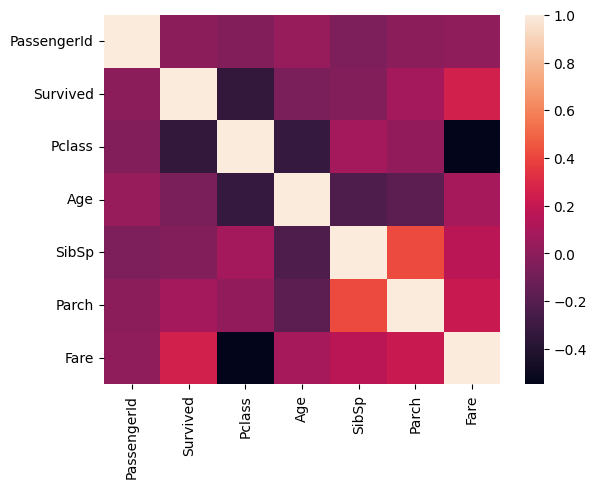

In [11]:
sns.heatmap(titanic_data.corr())

In [12]:
titanic_data.replace({'Sex':{'male':0,'female':1},'Embarked':{'S':0,'C':1,'Q':2}},inplace=True)
titanic_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",0,22.0,1,0,A/5 21171,7.2500,0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.0,1,0,PC 17599,71.2833,1
2,3,1,3,"Heikkinen, Miss. Laina",1,26.0,0,0,STON/O2. 3101282,7.9250,0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.0,1,0,113803,53.1000,0
4,5,0,3,"Allen, Mr. William Henry",0,35.0,0,0,373450,8.0500,0


In [13]:
X=titanic_data.drop(columns=["PassengerId","Ticket","Name","Survived"],axis=1)
Y=titanic_data["Survived"]
print(X)
print(Y)

     Pclass  Sex        Age  SibSp  Parch     Fare  Embarked
0         3    0  22.000000      1      0   7.2500         0
1         1    1  38.000000      1      0  71.2833         1
2         3    1  26.000000      0      0   7.9250         0
3         1    1  35.000000      1      0  53.1000         0
4         3    0  35.000000      0      0   8.0500         0
..      ...  ...        ...    ...    ...      ...       ...
886       2    0  27.000000      0      0  13.0000         0
887       1    1  19.000000      0      0  30.0000         0
888       3    1  29.699118      1      2  23.4500         0
889       1    0  26.000000      0      0  30.0000         1
890       3    0  32.000000      0      0   7.7500         2

[891 rows x 7 columns]
0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64


In [14]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=3)

In [15]:
model=DecisionTreeClassifier(criterion='entropy',random_state=1)
model.fit(X_train,Y_train)

DecisionTreeClassifier(criterion='entropy', random_state=1)

In [16]:
X_train_predict=model.predict(X_train)
training_data_accuracy=accuracy_score(Y_train,X_train_predict)
print("Accuracy score of  Training  data : ",training_data_accuracy)

Accuracy score of  Training  data :  0.9831460674157303


In [17]:
X_test_predict=model.predict(X_test)
testing_data_accuracy=accuracy_score(Y_test,X_test_predict)
print("Accuracy score of  Testing  data : ",testing_data_accuracy)

Accuracy score of  Testing  data :  0.770949720670391


In [18]:
from sklearn.metrics import confusion_matrix  
cm= confusion_matrix(Y_test, X_test_predict)  

In [19]:
cm

array([[83, 26],
       [15, 55]], dtype=int64)

In [20]:
from sklearn.metrics import classification_report
classification_report(Y_test, X_test_predict)

'              precision    recall  f1-score   support\n\n           0       0.85      0.76      0.80       109\n           1       0.68      0.79      0.73        70\n\n    accuracy                           0.77       179\n   macro avg       0.76      0.77      0.77       179\nweighted avg       0.78      0.77      0.77       179\n'

In [21]:
fig=plt.figure(figsize=(250,200))
img=tree.plot_tree(model,feature_names=['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked'],class_names=['0','1'],filled=True)


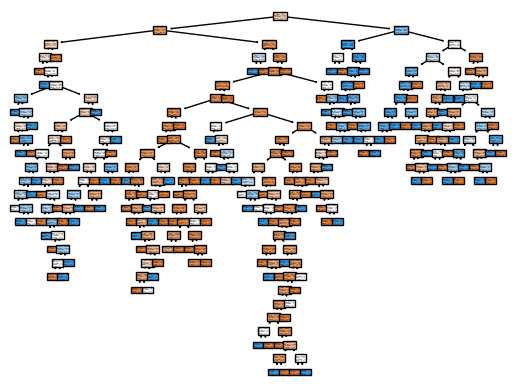

In [22]:
img=tree.plot_tree(model,feature_names=['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked'],class_names=['0','1'],filled=True)


In [23]:
plt.show()